# Movie Prediction Using Decision Tree

In [1]:
# Importing Required Libraries
import pandas as pd

In [2]:
data = pd.read_csv(r'regressive.csv')

In [3]:
data.head()

,Marketing expense,Production expense,Multiplex coverage,Budget,Movie_length,Lead_ Actor_Rating,Lead_Actress_rating,Director_rating,Producer_rating,Critic_rating,Trailer_views,3D_available,Time_taken,Twitter_hastags,Genre,Avg_age_actors,Num_multiplex,Collection
0,20.1264,59.62,0.462,36524.125,138.7,7.825,8.095,7.910,7.995,7.94,527367,YES,109.60,223.840,Thriller,23,494,48000
1,20.5462,69.14,0.531,35668.655,152.4,7.505,7.650,7.440,7.470,7.44,494055,NO,146.64,243.456,Drama,42,462,43200
2,20.5458,69.14,0.531,39912.675,134.6,7.485,7.570,7.495,7.515,7.44,547051,NO,147.88,2022.400,Comedy,38,458,69400
3,20.6474,59.36,0.542,38873.890,119.3,6.895,7.035,6.920,7.020,8.26,516279,YES,185.36,225.344,Drama,45,472,66800
4,21.3810,59.36,0.542,39701.585,127.7,6.920,7.070,6.815,7.070,8.26,531448,NO,176.48,225.792,Drama,55,395,72400


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Marketing expense    506 non-null    float64
 1   Production expense   506 non-null    float64
 2   Multiplex coverage   506 non-null    float64
 3   Budget               506 non-null    float64
 4   Movie_length         506 non-null    float64
 5   Lead_ Actor_Rating   506 non-null    float64
 6   Lead_Actress_rating  506 non-null    float64
 7   Director_rating      506 non-null    float64
 8   Producer_rating      506 non-null    float64
 9   Critic_rating        506 non-null    float64
 10  Trailer_views        506 non-null    int64  
 11  3D_available         506 non-null    object 
 12  Time_taken           494 non-null    float64
 13  Twitter_hastags      506 non-null    float64
 14  Genre                506 non-null    object 
 15  Avg_age_actors       506 non-null    int

In [5]:
# Preparing Data
data = pd.get_dummies(data, columns=['3D_available','Genre'])

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Marketing expense    506 non-null    float64
 1   Production expense   506 non-null    float64
 2   Multiplex coverage   506 non-null    float64
 3   Budget               506 non-null    float64
 4   Movie_length         506 non-null    float64
 5   Lead_ Actor_Rating   506 non-null    float64
 6   Lead_Actress_rating  506 non-null    float64
 7   Director_rating      506 non-null    float64
 8   Producer_rating      506 non-null    float64
 9   Critic_rating        506 non-null    float64
 10  Trailer_views        506 non-null    int64  
 11  Time_taken           494 non-null    float64
 12  Twitter_hastags      506 non-null    float64
 13  Avg_age_actors       506 non-null    int64  
 14  Num_multiplex        506 non-null    int64  
 15  Collection           506 non-null    int

In [7]:
data.head()

,Marketing expense,Production expense,Multiplex coverage,Budget,Movie_length,Lead_ Actor_Rating,Lead_Actress_rating,Director_rating,Producer_rating,Critic_rating,...,Twitter_hastags,Avg_age_actors,Num_multiplex,Collection,3D_available_NO,3D_available_YES,Genre_Action,Genre_Comedy,Genre_Drama,Genre_Thriller
0,20.1264,59.62,0.462,36524.125,138.7,7.825,8.095,7.910,7.995,7.94,...,223.840,23,494,48000,0,1,0,0,0,1
1,20.5462,69.14,0.531,35668.655,152.4,7.505,7.650,7.440,7.470,7.44,...,243.456,42,462,43200,1,0,0,0,1,0
2,20.5458,69.14,0.531,39912.675,134.6,7.485,7.570,7.495,7.515,7.44,...,2022.400,38,458,69400,1,0,0,1,0,0
3,20.6474,59.36,0.542,38873.890,119.3,6.895,7.035,6.920,7.020,8.26,...,225.344,45,472,66800,0,1,0,0,1,0
4,21.3810,59.36,0.542,39701.585,127.7,6.920,7.070,6.815,7.070,8.26,...,225.792,55,395,72400,1,0,0,0,1,0


In [8]:
# Filling Null Values by Mean of 'Time_taken'
data['Time_taken'] = data['Time_taken'].fillna(data['Time_taken'].mean())

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Marketing expense    506 non-null    float64
 1   Production expense   506 non-null    float64
 2   Multiplex coverage   506 non-null    float64
 3   Budget               506 non-null    float64
 4   Movie_length         506 non-null    float64
 5   Lead_ Actor_Rating   506 non-null    float64
 6   Lead_Actress_rating  506 non-null    float64
 7   Director_rating      506 non-null    float64
 8   Producer_rating      506 non-null    float64
 9   Critic_rating        506 non-null    float64
 10  Trailer_views        506 non-null    int64  
 11  Time_taken           506 non-null    float64
 12  Twitter_hastags      506 non-null    float64
 13  Avg_age_actors       506 non-null    int64  
 14  Num_multiplex        506 non-null    int64  
 15  Collection           506 non-null    int

In [10]:
# Decision for Collection -> y
y = data[['Collection']]

In [11]:
y

,Collection
0,48000
1,43200
2,69400
3,66800
4,72400
...,...
501,44800
502,41200
503,47800
504,44000


In [12]:
# features
x = data.drop(['Collection'], axis = 1) # Removed Collection Column axis=1

In [14]:
x.head()

,Marketing expense,Production expense,Multiplex coverage,Budget,Movie_length,Lead_ Actor_Rating,Lead_Actress_rating,Director_rating,Producer_rating,Critic_rating,...,Time_taken,Twitter_hastags,Avg_age_actors,Num_multiplex,3D_available_NO,3D_available_YES,Genre_Action,Genre_Comedy,Genre_Drama,Genre_Thriller
0,20.1264,59.62,0.462,36524.125,138.7,7.825,8.095,7.910,7.995,7.94,...,109.60,223.840,23,494,0,1,0,0,0,1
1,20.5462,69.14,0.531,35668.655,152.4,7.505,7.650,7.440,7.470,7.44,...,146.64,243.456,42,462,1,0,0,0,1,0
2,20.5458,69.14,0.531,39912.675,134.6,7.485,7.570,7.495,7.515,7.44,...,147.88,2022.400,38,458,1,0,0,1,0,0
3,20.6474,59.36,0.542,38873.890,119.3,6.895,7.035,6.920,7.020,8.26,...,185.36,225.344,45,472,0,1,0,0,1,0
4,21.3810,59.36,0.542,39701.585,127.7,6.920,7.070,6.815,7.070,8.26,...,176.48,225.792,55,395,1,0,0,0,1,0


In [16]:
# Dividing Data
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x,y,test_size = 0.15)

In [17]:
# Importing Decision Tree Algorithm
from sklearn import tree
model = tree.DecisionTreeRegressor(max_depth = 3)

In [18]:
model.fit(xtrain,ytrain)

DecisionTreeRegressor(max_depth=3)

In [21]:
ypredict = model.predict(xtest)

In [22]:
ypredict

array([24691.80327869, 45744.97354497, 24691.80327869, 45744.97354497,
       45744.97354497, 45744.97354497, 45744.97354497, 64887.5       ,
       24691.80327869, 35515.09433962, 35515.09433962, 35515.09433962,
       45744.97354497, 64887.5       , 45744.97354497, 96487.5       ,
       45744.97354497, 96487.5       , 45744.97354497, 24691.80327869,
       24691.80327869, 45744.97354497, 45744.97354497, 35515.09433962,
       35515.09433962, 35515.09433962, 45744.97354497, 24691.80327869,
       35515.09433962, 24691.80327869, 35515.09433962, 81700.        ,
       45744.97354497, 64887.5       , 35515.09433962, 35515.09433962,
       35515.09433962, 45744.97354497, 45744.97354497, 35515.09433962,
       24691.80327869, 96487.5       , 35515.09433962, 96487.5       ,
       35515.09433962, 35515.09433962, 81700.        , 81700.        ,
       24691.80327869, 45744.97354497, 35515.09433962, 24691.80327869,
       96487.5       , 35515.09433962, 35515.09433962, 45744.97354497,
      

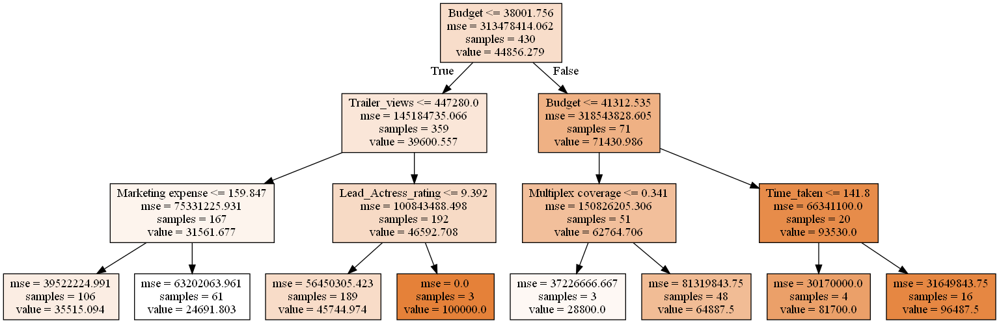

In [27]:
dot = tree.export_graphviz(model, out_file = None, 
                          feature_names = xtrain.columns,
                          filled = True)
from IPython.display import Image
import pydotplus

graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

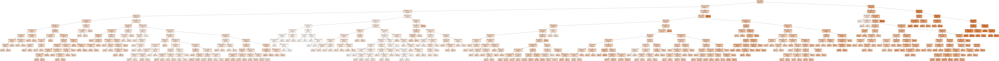

In [28]:
model = tree.DecisionTreeRegressor(max_depth = 12)
model.fit(xtrain,ytrain)
ypredict = model.predict(xtest)

dot = tree.export_graphviz(model, out_file = None, 
                          feature_names = xtrain.columns,
                          filled = True)
from IPython.display import Image
import pydotplus

graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

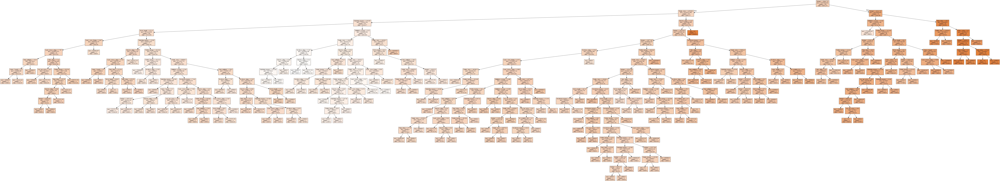

In [30]:
model = tree.DecisionTreeRegressor(min_samples_leaf = 2)
model.fit(xtrain,ytrain)
ypredict = model.predict(xtest)

dot = tree.export_graphviz(model, out_file = None, 
                          feature_names = xtrain.columns,
                          filled = True)
from IPython.display import Image
import pydotplus

graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

In [31]:
model = tree.DecisionTreeRegressor(min_samples_split = 2)
model.fit(xtrain,ytrain)
ypredict = model.predict(xtest)

dot = tree.export_graphviz(model, out_file = None, 
                          feature_names = xtrain.columns,
                          filled = True)
from IPython.display import Image
import pydotplus

graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())



